# Peak spreading (CA data)

NY data has some issues.

In [1]:
using CSV
using DataFrames
using Dates
using Plots
using Suppressor
using CategoricalArrays
using Statistics

const STATION1 = 401875 # 101 SB / Woodside Rd
const STATION2 = 401874 # 101 NB / Woodside Rd

401874

In [2]:
cols = [:timestamp, :station, :district, :freeway_number, :direction, :lane_type, :station_len, :samples, :pct_obs, :total_flow, :avg_occ, :avg_speed_mph]
# drop per-lane information, hide the warnings about extra columns
juldata = undef

@suppress begin
    juldata = CSV.read("../data/d04_july_5min_all.txt", DataFrame, select=1:12, header=cols, dateformat="mm/dd/yyyy HH:MM:SS")
end

,timestamp,station,district,freeway_number,direction,lane_type,station_len
,DateTime,Int64,Int64,Int64,String,String,Float64?
1,2019-07-01T00:00:00,400000,4,101,S,ML,0.415
2,2019-07-01T00:00:00,400001,4,101,N,ML,0.265
3,2019-07-01T00:00:00,400002,4,101,S,ML,0.31
4,2019-07-01T00:00:00,400006,4,880,S,ML,0.34
5,2019-07-01T00:00:00,400007,4,101,N,ML,0.365
6,2019-07-01T00:00:00,400009,4,80,W,ML,0.321
7,2019-07-01T00:00:00,400010,4,101,N,ML,0.47
8,2019-07-01T00:00:00,400011,4,101,S,ML,0.225
9,2019-07-01T00:00:00,400014,4,101,N,ML,0.29


In [3]:
juldata.date = Dates.Date.(juldata.timestamp)
# this could cause a memory issue with the full dataset if it allocates the daynames in memory
# as strings before making into categoricalarrays
juldata.day_of_week = CategoricalArray(Dates.dayname.(juldata.timestamp))
juldata.time = Dates.Time.(juldata.timestamp)

68756124-element Vector{Time}:
 00:00:00
 00:00:00
 00:00:00
 00:00:00
 00:00:00
 00:00:00
 00:00:00
 00:00:00
 00:00:00
 00:00:00
 00:00:00
 00:00:00
 00:00:00
 ⋮
 23:55:00
 23:55:00
 23:55:00
 23:55:00
 23:55:00
 23:55:00
 23:55:00
 23:55:00
 23:55:00
 23:55:00
 23:55:00
 23:55:00

In [4]:
# normalize to percent of total traffic for the day
grpd = groupby(juldata, [:station, :date])
transform!(grpd, :total_flow => ((x) -> x ./ sum(x)) => :normalized_flow)

,timestamp,station,district,freeway_number,direction,lane_type,station_len
,DateTime,Int64,Int64,Int64,String,String,Float64?
1,2019-07-01T00:00:00,400000,4,101,S,ML,0.415
2,2019-07-01T00:00:00,400001,4,101,N,ML,0.265
3,2019-07-01T00:00:00,400002,4,101,S,ML,0.31
4,2019-07-01T00:00:00,400006,4,880,S,ML,0.34
5,2019-07-01T00:00:00,400007,4,101,N,ML,0.365
6,2019-07-01T00:00:00,400009,4,80,W,ML,0.321
7,2019-07-01T00:00:00,400010,4,101,N,ML,0.47
8,2019-07-01T00:00:00,400011,4,101,S,ML,0.225
9,2019-07-01T00:00:00,400014,4,101,N,ML,0.29


In [5]:
period(date) = date < Date(2020, 3, 10) ? "prepandemic" : (date > Date(2020, 11, 1) ? "postpandemic" : "pandemic")
juldata.period = CategoricalArray(period.(juldata.date))

68756124-element CategoricalArray{String,1,UInt32}:
 "prepandemic"
 "prepandemic"
 "prepandemic"
 "prepandemic"
 "prepandemic"
 "prepandemic"
 "prepandemic"
 "prepandemic"
 "prepandemic"
 "prepandemic"
 "prepandemic"
 "prepandemic"
 "prepandemic"
 ⋮
 "postpandemic"
 "postpandemic"
 "postpandemic"
 "postpandemic"
 "postpandemic"
 "postpandemic"
 "postpandemic"
 "postpandemic"
 "postpandemic"
 "postpandemic"
 "postpandemic"
 "postpandemic"

In [6]:
weekdays = Set(["Monday", "Tuesday", "Wednesday", "Thursday", "Friday"])
avg_flows = combine(
    groupby(
        juldata[in.(juldata.day_of_week, [weekdays]), [:station, :period, :time, :normalized_flow, :avg_occ, :avg_speed_mph]],
        [:station, :period, :time]
    ), :normalized_flow => mean => :average_flow, :avg_occ => mean => :mean_avg_occ, :avg_speed_mph => mean => :mean_avg_speed_mph)

,station,period,time,average_flow,mean_avg_occ,mean_avg_speed_mph
,Int64,Cat…,Time,Float64?,Float64?,Float64?
1,400000,prepandemic,00:00:00,1.95108e-5,0.000182609,68.9217
2,400001,prepandemic,00:00:00,0.000870022,0.0101478,71.2174
3,400002,prepandemic,00:00:00,0.00187646,0.0674087,61.9957
4,400006,prepandemic,00:00:00,0.00127936,0.0198435,68.4174
5,400007,prepandemic,00:00:00,0.00120189,0.0222391,72.2826
6,400009,prepandemic,00:00:00,0.00122189,0.0216304,71.687
7,400010,prepandemic,00:00:00,0.00173954,0.022813,68.6609
8,400011,prepandemic,00:00:00,0.00064323,0.0107783,72.7609
9,400014,prepandemic,00:00:00,0.00121905,0.0231,68.1826


In [7]:
function plot_stn(stn::Int; col=:normalized_flow, avg_col=:average_flow)
    pre1 = plot(legend=false, yticks=false, title="Pre-pandemic", ylabel="Traffic volume (normalized)")
    for day in groupby(
            juldata[
                (juldata.station .== stn) .& (juldata.period .== "prepandemic"),
                [:time, col, :date]
                ], :date)
        day_df = sort(day, :time)
        plot!(pre1, day_df.time, day_df[!, col], linecolor=:gray, linealpha=0.4, lw=0.2)
    end
    avg_pre_flow_stn = avg_flows[(avg_flows.station .== stn) .& (avg_flows.period .== "prepandemic"), [:time, avg_col]]
    sort!(avg_pre_flow_stn, :time)
    plot!(pre1, avg_pre_flow_stn.time, avg_pre_flow_stn[!, avg_col], linecolor=:black, lw=2)

    post1 = plot(legend=false, yticks=false, title="Post-pandemic")
    for day in groupby(
            juldata[
                (juldata.station .== stn) .& (juldata.period .== "postpandemic"),
                [:time, col, :date]
                ], :date)
        day_df = sort(day, :time)
        plot!(post1, day_df.time, day_df[!, col], linecolor=:gray, linealpha=0.4, lw=0.2)
    end
    avg_post_flow_stn = avg_flows[(avg_flows.station .== stn) .& (avg_flows.period .== "postpandemic"), [:time, avg_col]]
    sort!(avg_post_flow_stn, :time)
    plot!(post1, avg_post_flow_stn.time, avg_post_flow_stn[!, avg_col], linecolor=:black, lw=2)

    comb = plot(avg_pre_flow_stn.time, avg_pre_flow_stn[!, avg_col], label="Pre-pandemic", yticks=false, title="Combined", legend=:bottomright)
    plot!(comb, avg_post_flow_stn.time, avg_post_flow_stn[!, avg_col], label="Post-pandemic")

    plot(pre1, post1, comb, layout=(1, 3), size=(1000, 400))
end

plot_stn (generic function with 1 method)

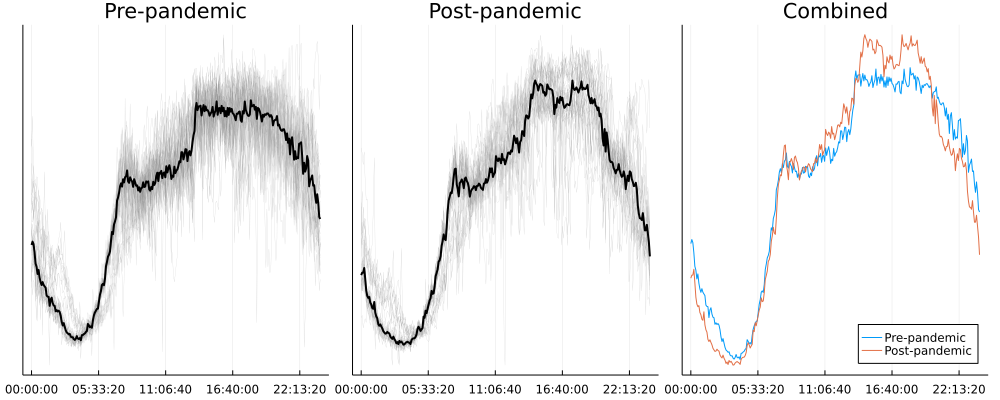

In [8]:
# Bay Bridge EB
plot_stn(404891)

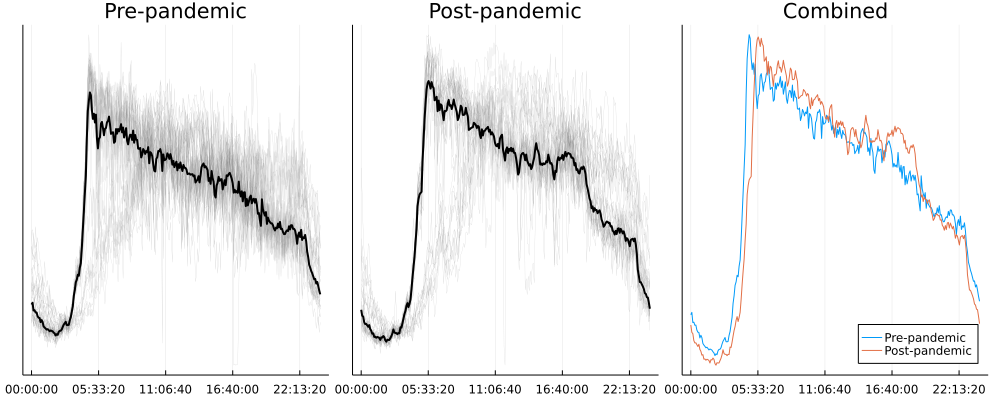

In [9]:
# Bay Bridge WB
plot_stn(404907)

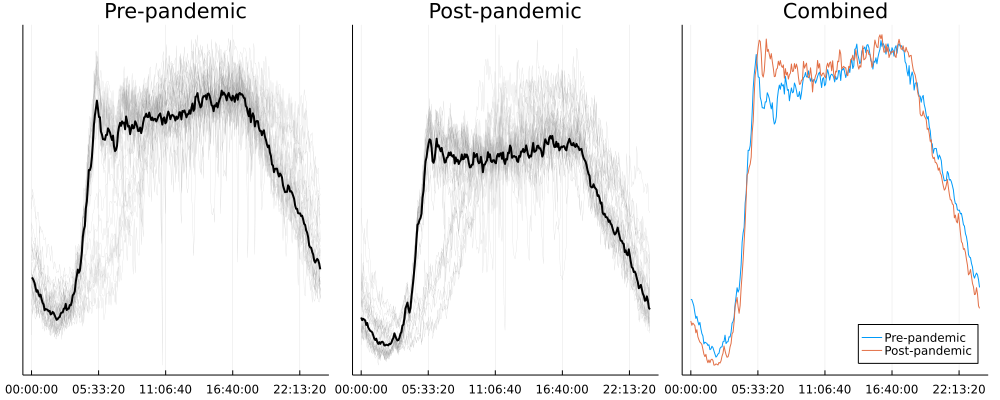

In [10]:
# I-880 SB
plot_stn(400486)

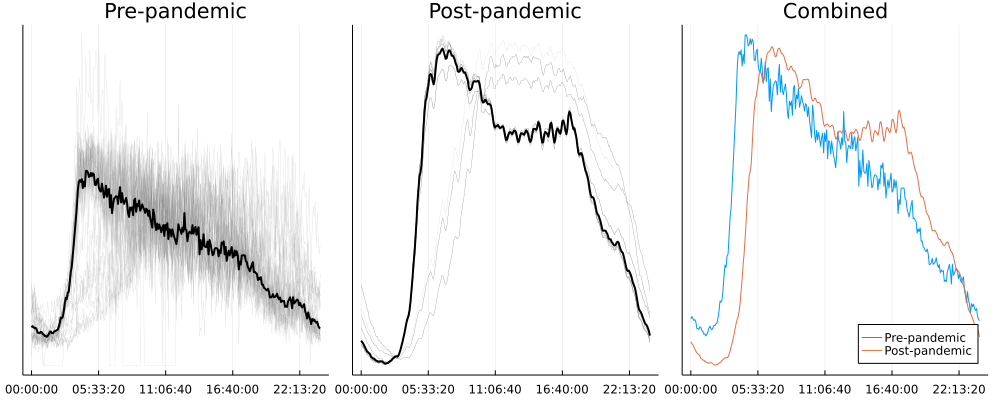

In [11]:
# Altamont WB
plot_stn(402409)

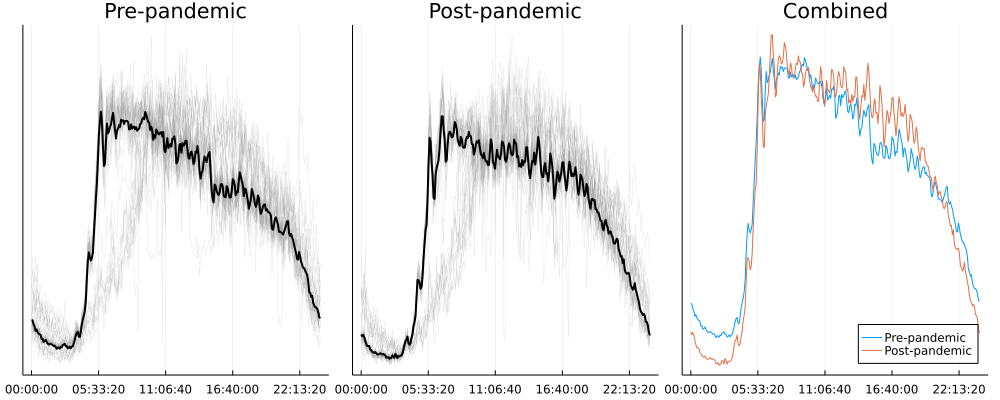

In [12]:
# SR 87 N
plot_stn(400664)

## Maybe throughput isn't what we want to look at. Maybe we should be looking at speeds.

Because low throughput can happen at both congested and uncongested times.

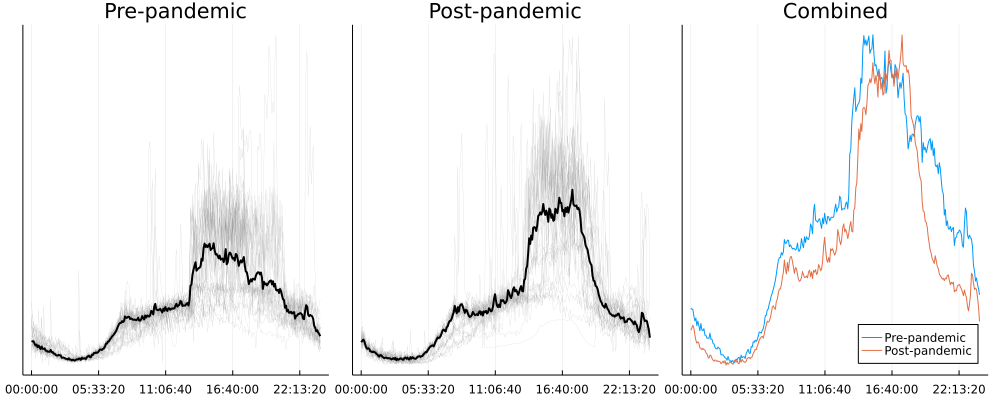

In [13]:
plot_stn(402815, col=:avg_occ, avg_col=:mean_avg_occ)

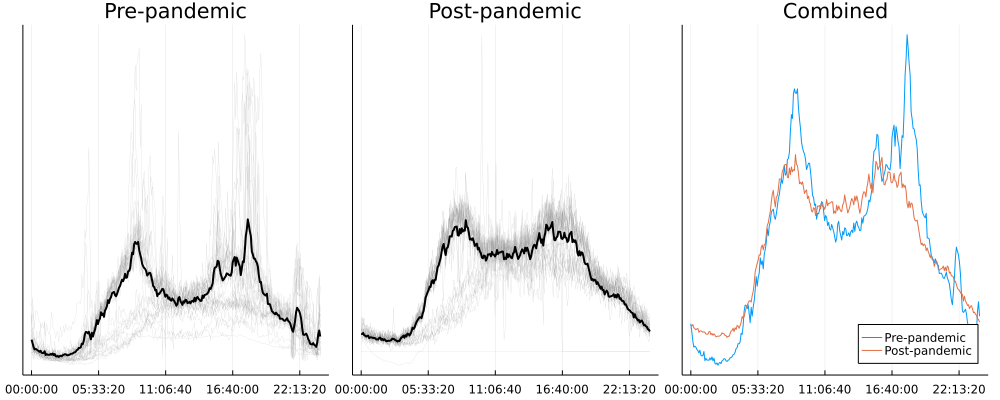

In [27]:
# 101 NB @ University
plot_stn(400859, col=:avg_occ, avg_col=:mean_avg_occ)

In [14]:
sum(avg_flows[(avg_flows.period .== "prepandemic") .& (avg_flows.station .== 402815), :mean_avg_occ]) * 5

125.07519565217396

In [15]:
sum(avg_flows[(avg_flows.period .== "postpandemic") .& (avg_flows.station .== 402815), :mean_avg_occ]) * 5

101.89827499999998

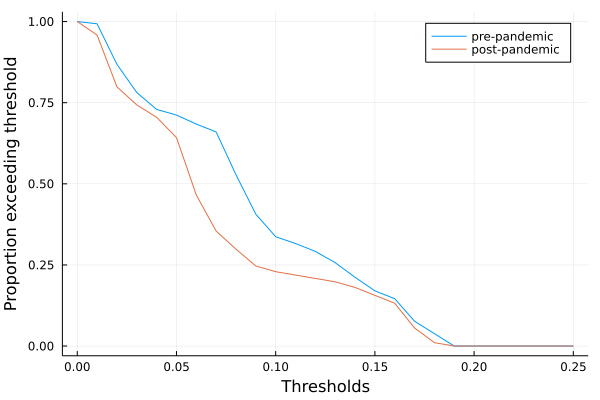

In [16]:
thresholds = collect(0:0.01:0.25)
cvpre = (t) -> mean(avg_flows[(avg_flows.period .== "prepandemic") .& (avg_flows.station .== 402815), :mean_avg_occ] .> t)
pre = cvpre.(thresholds)
cvpost = (t) -> mean(avg_flows[(avg_flows.period .== "postpandemic") .& (avg_flows.station .== 402815), :mean_avg_occ] .> t)
post = cvpost.(thresholds)
plot(thresholds, cvpre, label="pre-pandemic", xlab="Thresholds", ylab="Proportion exceeding threshold")
plot!(thresholds, cvpost, label="post-pandemic")

In [17]:
# compute proportion of total occupied time in each 5-minute chunk
transform!(groupby(avg_flows, [:station, :period]), :mean_avg_occ => sum => :total_occ)

,station,period,time,average_flow,mean_avg_occ,mean_avg_speed_mph
,Int64,Cat…,Time,Float64?,Float64?,Float64?
1,400000,prepandemic,00:00:00,1.95108e-5,0.000182609,68.9217
2,400001,prepandemic,00:00:00,0.000870022,0.0101478,71.2174
3,400002,prepandemic,00:00:00,0.00187646,0.0674087,61.9957
4,400006,prepandemic,00:00:00,0.00127936,0.0198435,68.4174
5,400007,prepandemic,00:00:00,0.00120189,0.0222391,72.2826
6,400009,prepandemic,00:00:00,0.00122189,0.0216304,71.687
7,400010,prepandemic,00:00:00,0.00173954,0.022813,68.6609
8,400011,prepandemic,00:00:00,0.00064323,0.0107783,72.7609
9,400014,prepandemic,00:00:00,0.00121905,0.0231,68.1826


In [18]:
avg_flows.p_of_total_occ = avg_flows.mean_avg_occ ./ avg_flows.total_occ

2263680-element Vector{Union{Missing, Float64}}:
 1.7514442117062367e-5
 0.0007744363022823307
 0.00207563843888534
 0.0009235467595123895
 0.001022659454401684
 0.0006831110373305421
 0.0014313184032848027
 0.0006311326348527279
 0.0018500856095514983
 0.000934389832616253
 0.0005699428138759103
 0.0016557862286957054
 0.00188438376711066
 ⋮
  missing
 0.0009895255953101523
  missing
 0.0005137339447094614
  missing
 0.0005178857506484347
  missing
 0.0005457417019440469
  missing
  missing
  missing
 0.0017739517339840096

In [19]:
max(skipmissing(avg_flows.p_of_total_occ)...)

0.02519483125564377

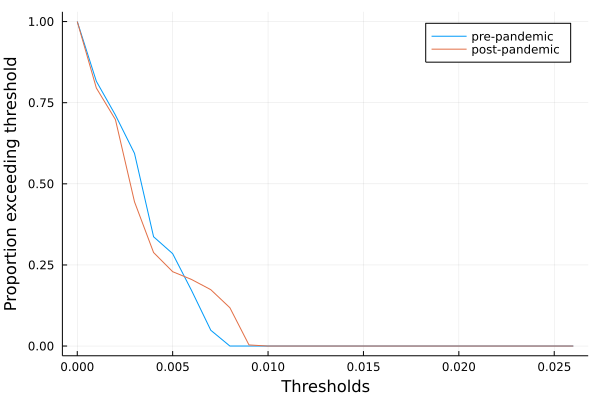

In [20]:
thresholds = collect(0:0.001:0.026)
cvpre = (t) -> mean(avg_flows[(avg_flows.period .== "prepandemic") .& (avg_flows.station .== 402815), :p_of_total_occ] .> t)
pre = cvpre.(thresholds)
cvpost = (t) -> mean(avg_flows[(avg_flows.period .== "postpandemic") .& (avg_flows.station .== 402815), :p_of_total_occ] .> t)
post = cvpost.(thresholds)
plot(thresholds, cvpre, label="pre-pandemic", xlab="Thresholds", ylab="Proportion exceeding threshold")
plot!(thresholds, cvpost, label="post-pandemic")

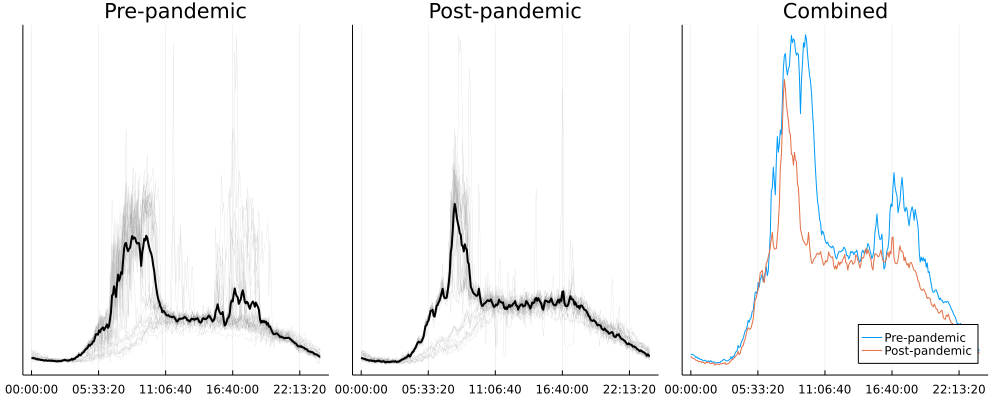

In [21]:
plot_stn(401949, col=:avg_occ, avg_col=:mean_avg_occ)

In [22]:
scatter(juldata.avg_occ[1:100000], juldata.avg_speed_mph[1:100000])

In [23]:
pre1 = plot(legend=false, yticks=false, title="Pre-pandemic", ylab="Traffic volume (normalized)")
for day in groupby(pre_stn1, :date)
    day_df = sort(day, :time)
    plot!(pre1, day_df.time, day_df.normalized_flow, linecolor=:gray, linealpha=0.4, lw=0.2)
end
sort!(avg_pre_flow_stn1, :time)
plot!(pre1, avg_pre_flow_stn1.time, avg_pre_flow_stn1.average_flow, linecolor=:black, lw=2)

post1 = plot(legend=false, yticks=false, title="Post-pandemic")
for day in groupby(post_stn1, :date)
    day_df = sort(day, :time)
    plot!(post1, day_df.time, day_df.normalized_flow, linecolor=:gray, linealpha=0.4, lw=0.2)
end
sort!(avg_post_flow_stn1, :time)
plot!(post1, avg_post_flow_stn1.time, avg_post_flow_stn1.average_flow, linecolor=:black, lw=2)

comb = plot(avg_pre_flow_stn1.time, avg_pre_flow_stn1.average_flow, label="Pre-pandemic", yticks=false, title="Combined", legend=:bottomright)
plot!(comb, avg_post_flow_stn1.time, avg_post_flow_stn1.average_flow, label="Post-pandemic")

plot(pre1, post1, comb, layout=(1, 3), size=(1000, 400))

LoadError: UndefVarError: pre_stn1 not defined

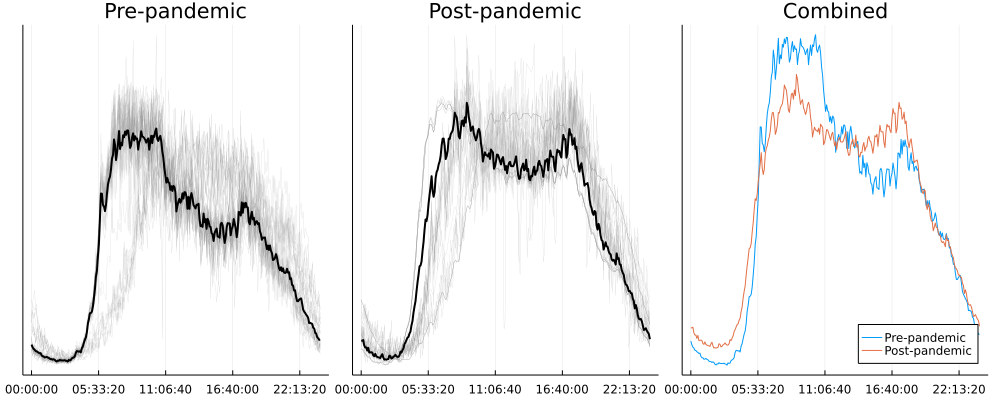

In [24]:
plot_stn(407336) # SR 85 NB

In [25]:
plot(pre_stn_data.time, pre_stn_data.total_flow / sum(pre_stn_data.total_flow) * 100, label="Th 2019-08-08")
plot!(post_stn_data.time, post_stn_data.total_flow / sum(post_stn_data.total_flow) * 100, label="Th 2021-08-05")

LoadError: UndefVarError: pre_stn_data not defined

In [26]:
    juldata[(juldata.station .== STATION1) .& (juldata.date .< Dates.Date(2021, 4, 12)) .& (in.(juldata.day_of_week, [weekdays])),
    [:time, :normalized_flow]]

,time,normalized_flow
,Time,Float64?
1,00:00:00,0.00182766
2,00:05:00,0.00186477
3,00:10:00,0.00199466
4,00:15:00,0.00163283
5,00:20:00,0.00178127
6,00:25:00,0.00166994
7,00:30:00,0.00191116
8,00:35:00,0.00137307
9,00:40:00,0.00138234
